### Predict the power (KW/h) produced from the windmills

### Importing libraries and dataset

In [113]:
# for mathematical operations
import numpy as np

# for dataframe operations
import pandas as pd

# for data visualizations
import matplotlib.pyplot as plt
import seaborn as sns

# full display of columns and rows
pd.set_option('display.max_column',None,'display.max_colwidth',1000,'display.max_rows',10000)
pd.options.mode.chained_assignment = None
pd.options.display.float_format = '{:.2f}'.format

# lets select a background style
sns.set_style('whitegrid')
plt.style.use('seaborn-deep')
plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (18, 8)
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.monospace'] = 'Ubunto Mono'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['legend.fontsize'] = 12
plt.rcParams['figure.titlesize'] = 14
plt.rcParams['figure.figsize'] = (16,10)

# for interactivity
import ipywidgets as widgets
from ipywidgets import interact
from ipywidgets import interact_manual

# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [114]:
df = pd.read_csv('train.csv')
df_test = pd.read_csv('test.csv')

In [116]:
df

,tracking_id,datetime,wind_speed(m/s),atmospheric_temperature(°C),shaft_temperature(°C),blades_angle(°),gearbox_temperature(°C),engine_temperature(°C),motor_torque(N-m),generator_temperature(°C),atmospheric_pressure(Pascal),area_temperature(°C),windmill_body_temperature(°C),wind_direction(°),resistance(ohm),rotor_torque(N-m),turbine_status,cloud_level,blade_length(m),blade_breadth(m),windmill_height(m),windmill_generated_power(kW/h)
0,WM_33725,2019-08-04 14:33:20,94.82,-99.00,41.72,-0.90,82.41,42.52,2563.12,76.67,103402.96,26.90,nan,239.84,2730.31,42.08,BA,Medium,2.22,0.31,24.28,6.77
1,WM_698,2018-11-05 10:13:20,241.83,27.76,-99.00,-99.00,44.10,46.26,2372.38,78.13,17030.90,39.80,nan,337.94,1780.21,107.89,A2,Medium,4.21,0.45,27.26,5.97
2,WM_39146,2019-09-14 14:03:20,95.48,nan,41.86,12.65,42.32,42.88,1657.17,67.65,16125.93,36.12,45.03,227.85,1666.05,-42.93,ABC,Medium,2.72,0.30,27.37,2.87
3,WM_6757,2018-12-25 15:33:20,238.82,-99.00,45.44,15.12,44.76,47.28,2888.13,95.39,18689.73,46.02,44.83,492.08,1964.50,42.74,ABC,NaN,4.86,0.37,24.29,14.85
4,WM_21521,2019-05-04 03:13:20,10.72,nan,41.98,1.72,-17.62,43.47,781.70,37.42,114468.17,34.57,-99.00,259.27,1177.52,13.39,AAA,Medium,nan,0.45,27.97,3.52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28195,WM_7814,2019-01-02 02:43:20,94.77,23.58,45.40,5.38,-1.09,48.53,2791.60,90.90,19428.73,45.43,44.24,536.15,1980.86,45.91,BB,Medium,2.77,0.42,24.59,9.59
28196,WM_32512,2019-07-26 12:53:20,94.20,24.03,42.07,-99.00,44.29,43.49,2207.88,72.24,16596.49,25.14,43.62,354.24,1712.84,36.97,BB,Low,-3.25,0.46,26.05,4.52
28197,WM_5193,2018-12-12 02:13:20,94.16,28.67,45.00,9.55,49.38,44.04,2801.66,94.81,19083.88,45.13,43.58,534.21,1951.73,88.32,D,Medium,nan,0.38,28.53,11.10
28198,WM_12173,2019-02-03 19:13:20,95.43,26.56,48.03,3.05,81.44,44.82,2760.65,90.14,18360.79,45.60,44.97,568.50,1968.92,47.56,BCB,Low,3.00,0.35,47.75,9.37


In [117]:
df_test

,tracking_id,datetime,wind_speed(m/s),atmospheric_temperature(°C),shaft_temperature(°C),blades_angle(°),gearbox_temperature(°C),engine_temperature(°C),motor_torque(N-m),generator_temperature(°C),atmospheric_pressure(Pascal),area_temperature(°C),windmill_body_temperature(°C),wind_direction(°),resistance(ohm),rotor_torque(N-m),turbine_status,cloud_level,blade_length(m),blade_breadth(m),windmill_height(m)
0,WM_19817,2019-04-17 08:53:20,94.32,17.64,89.71,51.15,40.46,39.59,1073.20,66.83,16681.04,24.00,43.76,445.98,1664.22,21.91,BA,Medium,3.19,0.40,25.57
1,WM_18723,2019-03-30 07:43:20,10.09,13.98,43.27,46.52,40.03,41.18,517.44,37.28,nan,29.43,42.73,499.60,1165.11,-35.05,A,Medium,3.02,0.44,24.37
2,WM_34552,2019-08-10 11:33:20,347.15,31.42,41.08,26.93,43.11,43.44,1480.72,70.01,214812.84,29.92,43.26,245.43,1667.72,27.20,B2,Medium,2.61,0.39,27.65
3,WM_28570,2019-06-26 03:53:20,24.47,-99.00,14.38,66.51,13.74,15.58,887.98,41.45,nan,23.89,13.50,nan,1329.74,15.25,BBB,Low,2.87,0.45,24.19
4,WM_36934,2019-08-27 16:43:20,97.00,33.28,41.41,1.84,121.57,43.93,2053.92,68.01,16833.55,35.91,-99.00,442.43,691.41,34.26,A,Low,3.55,0.37,4.89
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12081,WM_13376,2019-02-12 11:33:20,-15.04,18.52,43.55,-1.09,44.55,44.49,2424.37,75.85,17239.35,28.42,42.13,509.80,1798.14,-14.37,NaN,Medium,3.29,0.41,20.89
12082,WM_1630,2018-11-12 17:33:20,97.59,-99.00,44.75,1.75,43.31,42.85,2085.63,73.09,17131.45,50.62,47.35,345.71,1680.25,-7.06,AB,Low,nan,0.37,24.79
12083,WM_24703,2019-05-27 11:53:20,16.19,8.11,43.25,-0.69,214.90,41.18,788.69,39.51,118707.64,20.98,41.77,205.57,2343.17,12.33,BA,Low,3.73,0.46,5.65
12084,WM_22893,2019-05-13 21:53:20,93.25,-99.00,43.84,-1.17,41.98,42.04,2079.86,71.48,17155.27,29.11,82.75,260.58,1732.88,nan,A,Medium,2.25,0.39,24.59


### Exploratory Data Analysis (EDA)

In [118]:
df.info

<bound method DataFrame.info of       tracking_id             datetime  wind_speed(m/s)  atmospheric_temperature(°C)  shaft_temperature(°C)  blades_angle(°)  gearbox_temperature(°C)  engine_temperature(°C)  motor_torque(N-m)  generator_temperature(°C)  atmospheric_pressure(Pascal)  area_temperature(°C)  windmill_body_temperature(°C)  wind_direction(°)  resistance(ohm)  rotor_torque(N-m) turbine_status cloud_level  \
0        WM_33725  2019-08-04 14:33:20            94.82                       -99.00                  41.72            -0.90                    82.41                   42.52            2563.12                      76.67                     103402.96                 26.90                            nan             239.84          2730.31              42.08             BA      Medium   
1          WM_698  2018-11-05 10:13:20           241.83                        27.76                 -99.00           -99.00                    44.10                   46.26            2372.38

In [119]:
df.nunique()

tracking_id                       28200
datetime                          28200
wind_speed(m/s)                   27727
atmospheric_temperature(°C)       20809
shaft_temperature(°C)             27625
blades_angle(°)                   22830
gearbox_temperature(°C)           27911
engine_temperature(°C)            28188
motor_torque(N-m)                 27660
generator_temperature(°C)         28187
atmospheric_pressure(Pascal)      25492
area_temperature(°C)              28170
windmill_body_temperature(°C)     21893
wind_direction(°)                 22984
resistance(ohm)                   27365
rotor_torque(N-m)                 25945
turbine_status                       14
cloud_level                           3
blade_length(m)                   22833
blade_breadth(m)                  28200
windmill_height(m)                27657
windmill_generated_power(kW/h)    27988
dtype: int64

In [120]:
df_test.info

<bound method DataFrame.info of       tracking_id             datetime  wind_speed(m/s)  atmospheric_temperature(°C)  shaft_temperature(°C)  blades_angle(°)  gearbox_temperature(°C)  engine_temperature(°C)  motor_torque(N-m)  generator_temperature(°C)  atmospheric_pressure(Pascal)  area_temperature(°C)  windmill_body_temperature(°C)  wind_direction(°)  resistance(ohm)  rotor_torque(N-m) turbine_status cloud_level  \
0        WM_19817  2019-04-17 08:53:20            94.32                        17.64                  89.71            51.15                    40.46                   39.59            1073.20                      66.83                      16681.04                 24.00                          43.76             445.98          1664.22              21.91             BA      Medium   
1        WM_18723  2019-03-30 07:43:20            10.09                        13.98                  43.27            46.52                    40.03                   41.18             517.44

In [8]:
df_test.nunique()

tracking_id                      12086
datetime                         12086
wind_speed(m/s)                  11875
atmospheric_temperature(°C)       8988
shaft_temperature(°C)            11839
blades_angle(°)                   9820
gearbox_temperature(°C)          11952
engine_temperature(°C)           12081
motor_torque(N-m)                11856
generator_temperature(°C)        12081
atmospheric_pressure(Pascal)     10935
area_temperature(°C)             12075
windmill_body_temperature(°C)     9459
wind_direction(°)                 9885
resistance(ohm)                  11727
rotor_torque(N-m)                11128
turbine_status                      14
cloud_level                          3
blade_length(m)                   9849
blade_breadth(m)                 12086
windmill_height(m)               11831
dtype: int64

In [9]:
df.isnull().sum()

tracking_id                          0
datetime                             0
wind_speed(m/s)                    273
atmospheric_temperature(°C)       3450
shaft_temperature(°C)                2
blades_angle(°)                    216
gearbox_temperature(°C)              1
engine_temperature(°C)              12
motor_torque(N-m)                   24
generator_temperature(°C)           12
atmospheric_pressure(Pascal)      2707
area_temperature(°C)                 0
windmill_body_temperature(°C)     2363
wind_direction(°)                 5103
resistance(ohm)                      1
rotor_torque(N-m)                  572
turbine_status                    1759
cloud_level                        276
blade_length(m)                   5093
blade_breadth(m)                     0
windmill_height(m)                 543
windmill_generated_power(kW/h)     207
dtype: int64

In [10]:
df_test.isnull().sum()

tracking_id                         0
datetime                            0
wind_speed(m/s)                   126
atmospheric_temperature(°C)      1427
shaft_temperature(°C)               1
blades_angle(°)                   106
gearbox_temperature(°C)             1
engine_temperature(°C)              5
motor_torque(N-m)                  11
generator_temperature(°C)           5
atmospheric_pressure(Pascal)     1151
area_temperature(°C)                1
windmill_body_temperature(°C)     926
wind_direction(°)                2160
resistance(ohm)                     0
rotor_torque(N-m)                 281
turbine_status                    797
cloud_level                       125
blade_length(m)                  2114
blade_breadth(m)                    0
windmill_height(m)                255
dtype: int64

In [11]:
df.isnull().sum(axis=1)

0        1
1        1
2        1
3        1
4        2
        ..
28195    0
28196    0
28197    1
28198    0
28199    1
Length: 28200, dtype: int64

In [12]:
df_test.isnull().sum(axis=1)

0        0
1        1
2        0
3        2
4        0
        ..
12081    1
12082    1
12083    0
12084    1
12085    2
Length: 12086, dtype: int64

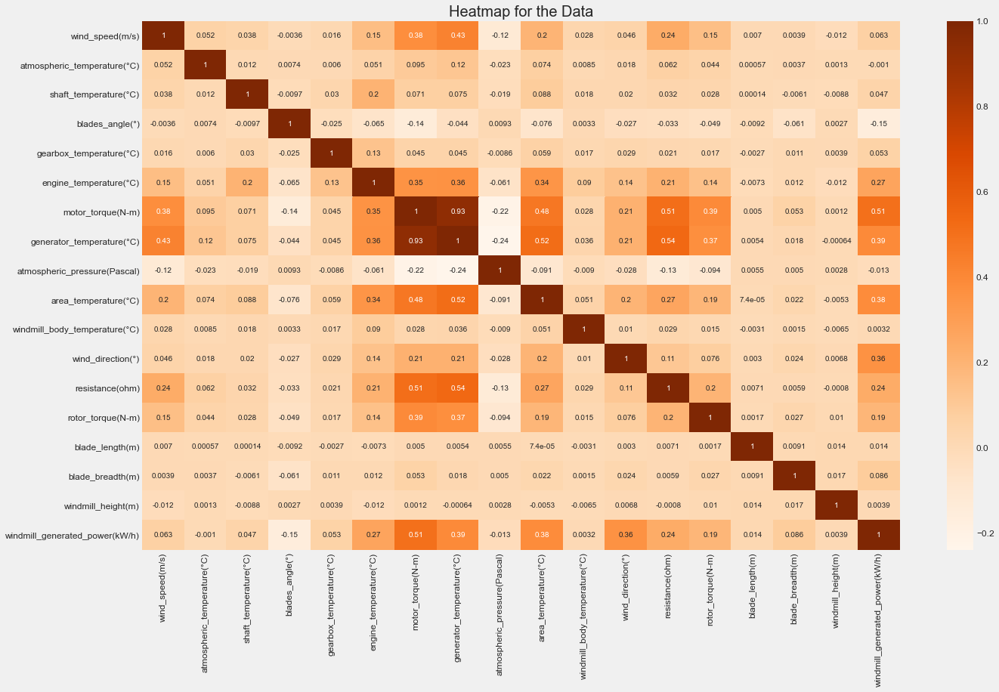

In [121]:
plt.rcParams['figure.figsize'] = (20, 12)
sns.heatmap(df.corr(), cmap = 'Oranges', annot = True)
plt.title('Heatmap for the Data', fontsize = 20)
plt.show()

* From the above plot, features `motor_torque(N-m)` and `generator_temperature(°C)` are `highly correlated` and therefore we will be `dropping` one of them in the end.

In [14]:
## Spliting the train dataset into categorical and numerical features
def getFeatures(df):
    num_features = df.select_dtypes(include=[np.number])
    cat_features = df.select_dtypes(include=[np.object])
    return num_features,cat_features

In [15]:
num_features,cat_features = getFeatures(df)

In [16]:
num_features

,wind_speed(m/s),atmospheric_temperature(°C),shaft_temperature(°C),blades_angle(°),gearbox_temperature(°C),engine_temperature(°C),motor_torque(N-m),generator_temperature(°C),atmospheric_pressure(Pascal),area_temperature(°C),windmill_body_temperature(°C),wind_direction(°),resistance(ohm),rotor_torque(N-m),blade_length(m),blade_breadth(m),windmill_height(m),windmill_generated_power(kW/h)
0,94.82,-99.00,41.72,-0.90,82.41,42.52,2563.12,76.67,103402.96,26.90,nan,239.84,2730.31,42.08,2.22,0.31,24.28,6.77
1,241.83,27.76,-99.00,-99.00,44.10,46.26,2372.38,78.13,17030.90,39.80,nan,337.94,1780.21,107.89,4.21,0.45,27.26,5.97
2,95.48,nan,41.86,12.65,42.32,42.88,1657.17,67.65,16125.93,36.12,45.03,227.85,1666.05,-42.93,2.72,0.30,27.37,2.87
3,238.82,-99.00,45.44,15.12,44.76,47.28,2888.13,95.39,18689.73,46.02,44.83,492.08,1964.50,42.74,4.86,0.37,24.29,14.85
4,10.72,nan,41.98,1.72,-17.62,43.47,781.70,37.42,114468.17,34.57,-99.00,259.27,1177.52,13.39,nan,0.45,27.97,3.52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28195,94.77,23.58,45.40,5.38,-1.09,48.53,2791.60,90.90,19428.73,45.43,44.24,536.15,1980.86,45.91,2.77,0.42,24.59,9.59
28196,94.20,24.03,42.07,-99.00,44.29,43.49,2207.88,72.24,16596.49,25.14,43.62,354.24,1712.84,36.97,-3.25,0.46,26.05,4.52
28197,94.16,28.67,45.00,9.55,49.38,44.04,2801.66,94.81,19083.88,45.13,43.58,534.21,1951.73,88.32,nan,0.38,28.53,11.10
28198,95.43,26.56,48.03,3.05,81.44,44.82,2760.65,90.14,18360.79,45.60,44.97,568.50,1968.92,47.56,3.00,0.35,47.75,9.37


In [17]:
cat_features

,tracking_id,datetime,turbine_status,cloud_level
0,WM_33725,2019-08-04 14:33:20,BA,Medium
1,WM_698,2018-11-05 10:13:20,A2,Medium
2,WM_39146,2019-09-14 14:03:20,ABC,Medium
3,WM_6757,2018-12-25 15:33:20,ABC,NaN
4,WM_21521,2019-05-04 03:13:20,AAA,Medium
...,...,...,...,...
28195,WM_7814,2019-01-02 02:43:20,BB,Medium
28196,WM_32512,2019-07-26 12:53:20,BB,Low
28197,WM_5193,2018-12-12 02:13:20,D,Medium
28198,WM_12173,2019-02-03 19:13:20,BCB,Low


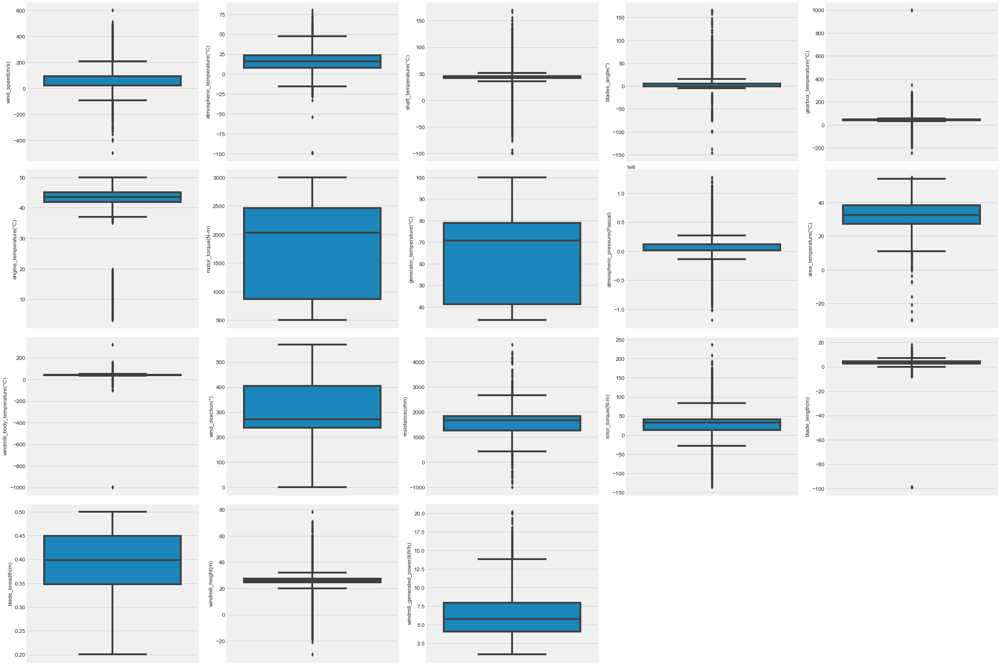

In [18]:
## Box plot of numerical features
fig = plt.figure(figsize=(30,20))

for i in range(len(num_features.columns)):
    fig.add_subplot(4,5,i+1)
    sns.boxplot(y = num_features.iloc[:,i])
plt.tight_layout()
plt.show()

* It gives us hint that there were `outlier`

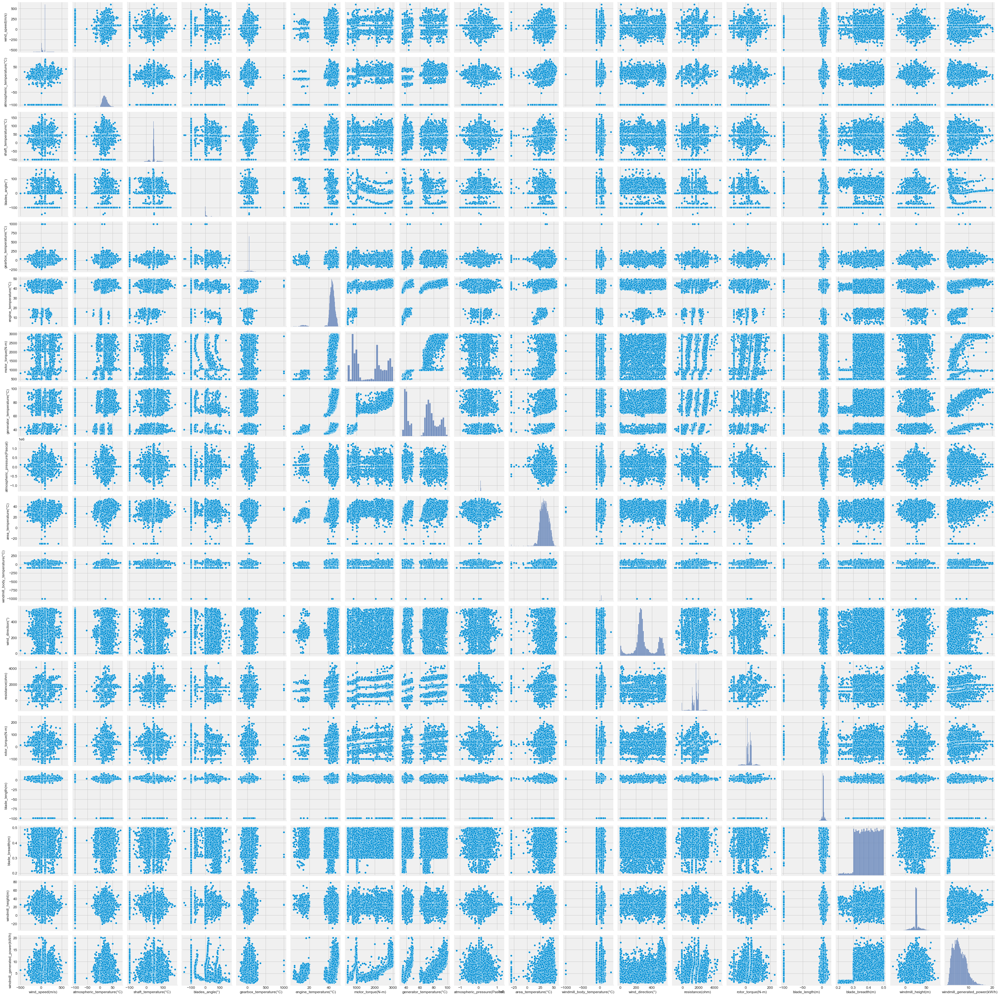

In [19]:
sns.pairplot(df)
plt.show()

In [20]:
skew_features = num_features.apply(lambda x :x.skew()).sort_values(ascending=True)
skew_features

blade_length(m)                  -8.61
engine_temperature(°C)           -3.94
shaft_temperature(°C)            -2.53
windmill_body_temperature(°C)    -2.24
atmospheric_temperature(°C)      -1.67
rotor_torque(N-m)                -1.03
resistance(ohm)                  -0.70
blades_angle(°)                  -0.65
area_temperature(°C)             -0.63
blade_breadth(m)                 -0.19
generator_temperature(°C)        -0.19
windmill_height(m)               -0.11
wind_speed(m/s)                  -0.06
motor_torque(N-m)                 0.03
atmospheric_pressure(Pascal)      0.06
wind_direction(°)                 0.17
windmill_generated_power(kW/h)    0.69
gearbox_temperature(°C)           0.89
dtype: float64

In [21]:
## Copying the train dataframe into new dataframe and we will be performing changes on the new dataframe
df_cpy = df.copy()

### Now let us begin with analysing each and every feature### 

In [22]:
def comparing_train_and_test_feature(df,df_test,col):
    fig = plt.figure(figsize=(16,10))
    ax0 = fig.add_subplot(1,2,1)
    ax1 = fig.add_subplot(1,2,2)
    df[col].plot(kind='kde',ax=ax0)
    df_test[col].plot(kind='kde',ax=ax1)
    ax0.set_xlabel(col)
    ax1.set_xlabel(col)
    ax0.set_title("Density plot of " + str(col) + " of training set")
    ax1.set_title("Density plot of " + str(col) + " of testing set")
    plt.show()

### wind_speed(m/s)

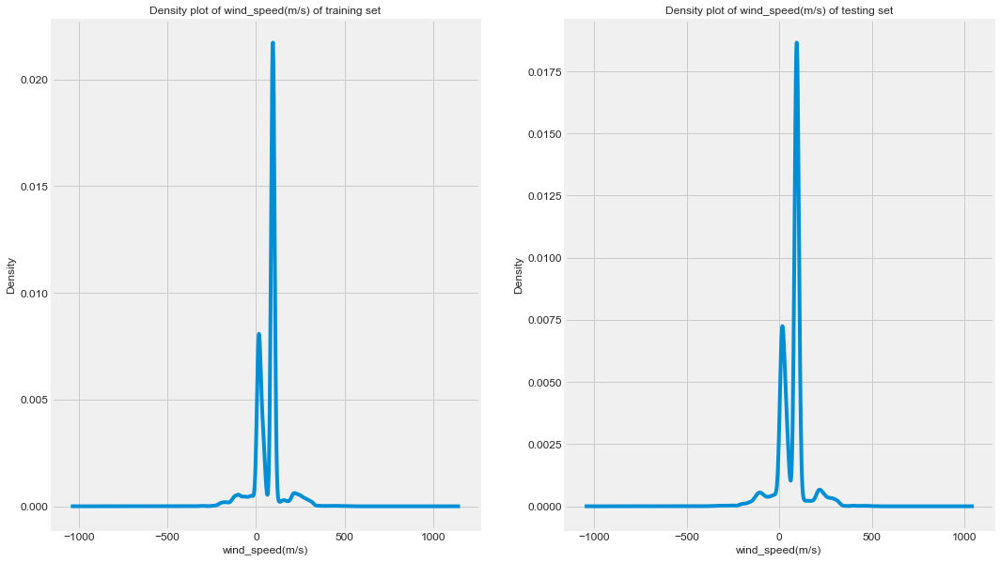

In [23]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'wind_speed(m/s)')
## Distribution of Feature wind_speed(m/s) of training and testing dataset are very similar

<AxesSubplot:ylabel='wind_speed(m/s)'>

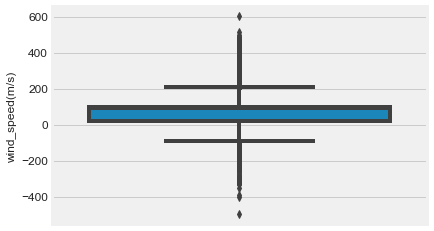

In [24]:
sns.boxplot(y='wind_speed(m/s)',data=df)

<AxesSubplot:xlabel='wind_speed(m/s)', ylabel='windmill_generated_power(kW/h)'>

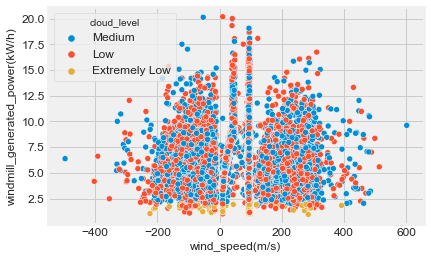

In [25]:
sns.scatterplot(x='wind_speed(m/s)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

In [26]:
df['wind_speed(m/s)'].value_counts()

10.00    193
81.82      9
93.61      1
94.23      1
95.47      1
        ... 
92.25      1
10.34      1
95.96      1
32.77      1
96.46      1
Name: wind_speed(m/s), Length: 27727, dtype: int64

### atmospheric_temperature(°C)

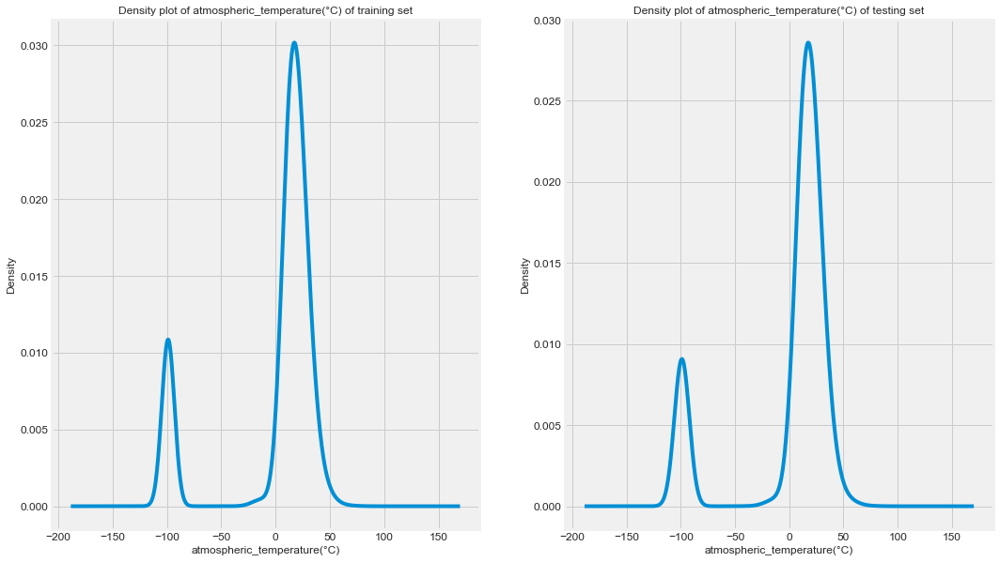

In [27]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'atmospheric_temperature(°C)')
## Distribution of Feature "atmospheric_temperature(°C)" of training and testing dataset is very similar

<AxesSubplot:ylabel='atmospheric_temperature(°C)'>

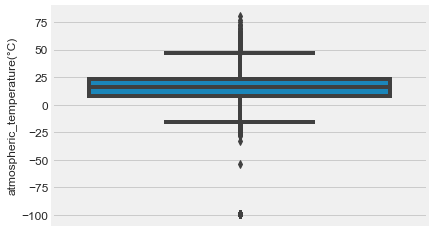

In [28]:
sns.boxplot(y='atmospheric_temperature(°C)',data=df)

<AxesSubplot:xlabel='atmospheric_temperature(°C)', ylabel='windmill_generated_power(kW/h)'>

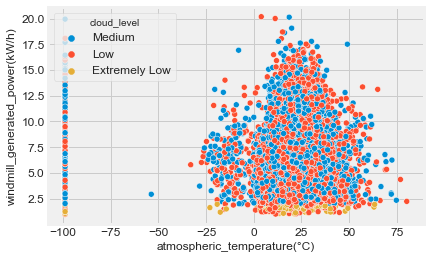

In [29]:
sns.scatterplot(x='atmospheric_temperature(°C)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

In [30]:
df[df['atmospheric_temperature(°C)'] < -50]

,tracking_id,datetime,wind_speed(m/s),atmospheric_temperature(°C),shaft_temperature(°C),blades_angle(°),gearbox_temperature(°C),engine_temperature(°C),motor_torque(N-m),generator_temperature(°C),atmospheric_pressure(Pascal),area_temperature(°C),windmill_body_temperature(°C),wind_direction(°),resistance(ohm),rotor_torque(N-m),turbine_status,cloud_level,blade_length(m),blade_breadth(m),windmill_height(m),windmill_generated_power(kW/h)
0,WM_33725,2019-08-04 14:33:20,94.82,-99.00,41.72,-0.90,82.41,42.52,2563.12,76.67,103402.96,26.90,nan,239.84,2730.31,42.08,BA,Medium,2.22,0.31,24.28,6.77
3,WM_6757,2018-12-25 15:33:20,238.82,-99.00,45.44,15.12,44.76,47.28,2888.13,95.39,18689.73,46.02,44.83,492.08,1964.50,42.74,ABC,NaN,4.86,0.37,24.29,14.85
6,WM_19873,2019-04-17 18:33:20,16.03,-99.00,44.07,-0.20,41.68,43.38,778.11,40.28,121813.38,33.85,43.01,528.00,1222.93,11.81,BD,Low,2.92,0.45,33.59,5.09
8,WM_26069,2019-06-07 17:53:20,47.08,-99.00,-33.61,-99.00,43.06,45.25,957.58,41.61,119628.96,26.17,43.22,281.37,-99.00,19.49,ABC,Low,1.65,0.30,46.73,8.74
22,WM_11642,2019-01-31 00:43:20,47.11,-99.00,43.17,8.12,48.08,47.91,953.50,46.37,139445.41,37.88,nan,494.37,1473.50,17.45,AB,Low,2.46,0.36,27.75,10.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28169,WM_29961,2019-07-06 04:43:20,156.31,-99.00,42.85,-1.27,41.46,41.21,774.42,38.85,121663.19,22.35,41.40,285.07,1242.69,13.56,BCB,Low,2.18,0.34,27.66,5.90
28172,WM_37184,2019-08-31 10:43:20,12.26,-99.00,44.23,0.85,-29.20,42.07,782.34,37.33,nan,28.10,42.38,306.10,1193.57,12.02,BBB,Low,3.23,0.33,44.26,3.62
28175,WM_33879,2019-08-05 16:43:20,95.48,-99.00,42.84,-1.18,45.73,45.20,2325.05,78.09,nan,28.17,-99.00,234.25,1782.52,38.60,BBB,Medium,nan,0.43,23.04,6.10
28177,WM_17138,2019-03-17 11:53:20,238.20,-99.00,43.67,-99.00,42.23,42.91,2130.21,68.23,468449.36,28.97,43.59,0.00,468.33,35.08,D,Medium,3.74,0.50,26.73,2.98


* From the above density plot of feature "atmospheric_temperature(°C)", we found that the distribution of "atmospheric_temperature(°C)" is almost same in training and testing dataset, so we are not changing anything in it.

### shaft_temperature(°C)

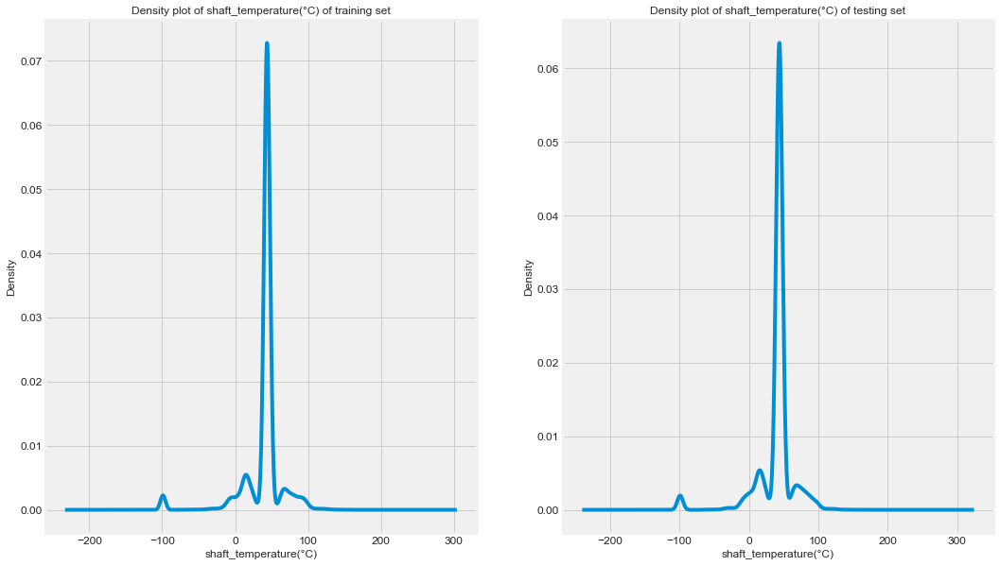

In [31]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'shaft_temperature(°C)')
## Distribution of Feature "shaft_temperature(°C)" of training and testing dataset are almost same

<AxesSubplot:ylabel='shaft_temperature(°C)'>

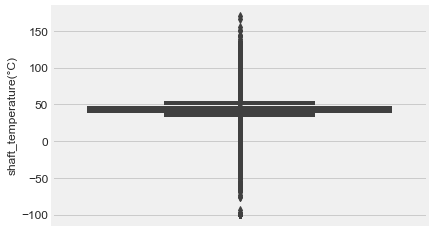

In [32]:
sns.boxplot(y='shaft_temperature(°C)',data=df)

<AxesSubplot:xlabel='shaft_temperature(°C)', ylabel='windmill_generated_power(kW/h)'>

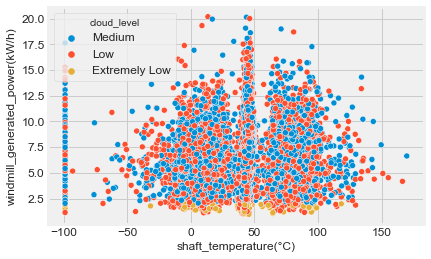

In [33]:
sns.scatterplot(x='shaft_temperature(°C)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

* From the above density plot of feature "shaft_temperature(°C)", we found that the distribution of "shaft_temperature(°C)" is almost same in training and testing dataset, so we are not changing anything in it.

<AxesSubplot:xlabel='shaft_temperature(°C)', ylabel='wind_speed(m/s)'>

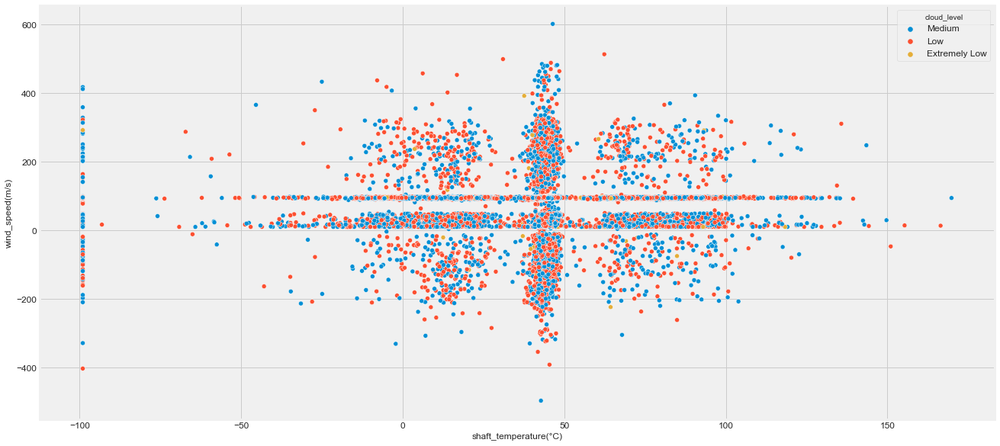

In [34]:
plt.figure(figsize=(20,10))
sns.scatterplot(x='shaft_temperature(°C)',y='wind_speed(m/s)',hue='cloud_level',data=df)

### blades_angle(°)

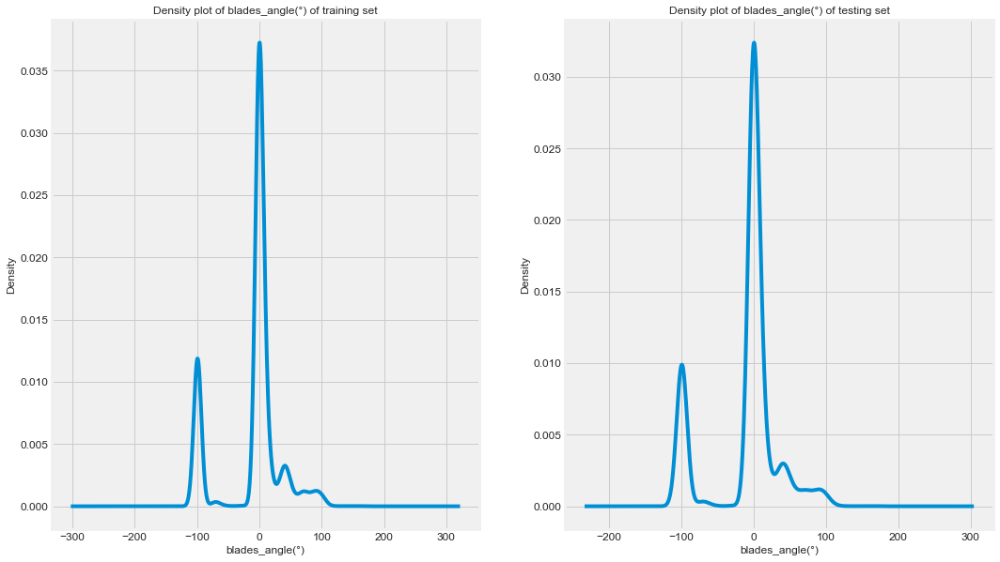

In [35]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'blades_angle(°)')
## Distribution of Feature "blades_angle(°)" of training and testing dataset are almost same

<AxesSubplot:ylabel='blades_angle(°)'>

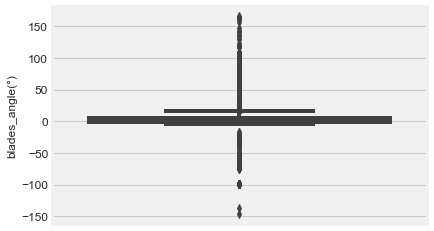

In [36]:
sns.boxplot(y='blades_angle(°)',data=df)

<AxesSubplot:xlabel='blades_angle(°)', ylabel='windmill_generated_power(kW/h)'>

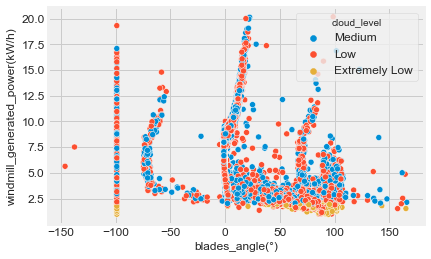

In [37]:
sns.scatterplot(x='blades_angle(°)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

* From the above density plot of feature "blades_angle(°)", we found that the distribution of "blades_angle(°)" is almost same in training and testing dataset, so we are not changing anything in it.

### gearbox_temperature(°C)

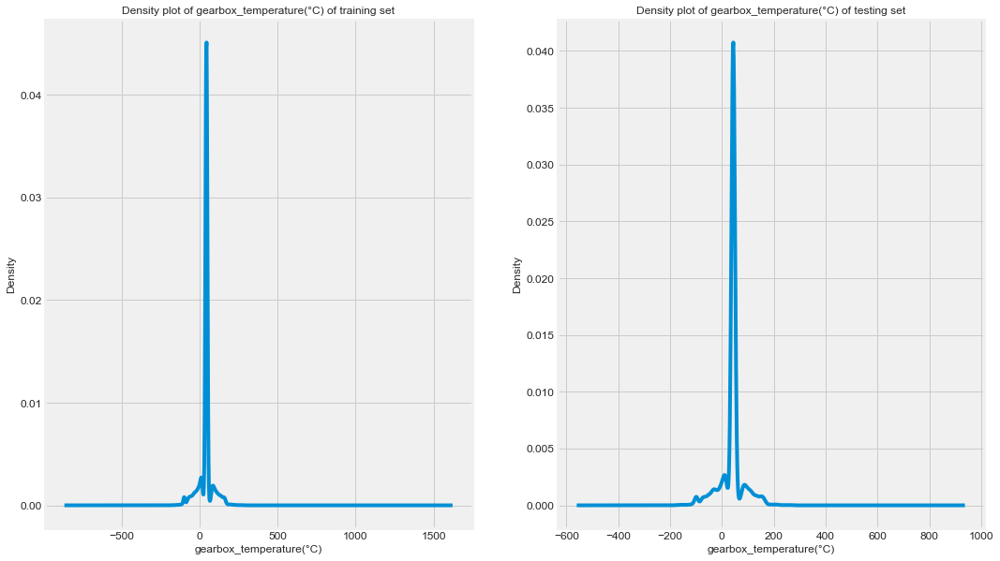

In [38]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'gearbox_temperature(°C)')
## Distribution of Feature "gearbox_temperature(°C)" of training and testing dataset are almost similar

<AxesSubplot:ylabel='gearbox_temperature(°C)'>

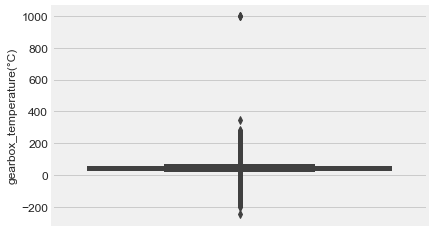

In [39]:
sns.boxplot(y='gearbox_temperature(°C)',data=df)

<AxesSubplot:xlabel='gearbox_temperature(°C)', ylabel='windmill_generated_power(kW/h)'>

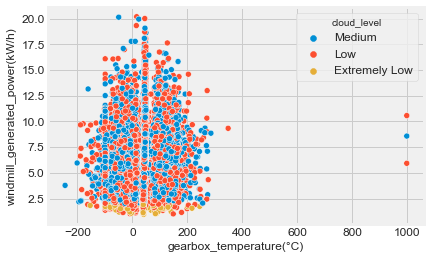

In [40]:
sns.scatterplot(x='gearbox_temperature(°C)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

In [41]:
## Here we are removing extreme outliers which are present in a very less number
low = df_cpy['gearbox_temperature(°C)'] < -200
high = df_cpy['gearbox_temperature(°C)'] > 300
low = np.where(low)
high = np.where(high)
df_cpy.drop(low[0],inplace=True)
df_cpy.drop(high[0],inplace=True)
df_cpy.index = range(df_cpy.shape[0])

* After removing extreme outliers of feature "gearbox_temperature(°C)", it's scatterplot is shown below.

<AxesSubplot:xlabel='gearbox_temperature(°C)', ylabel='windmill_generated_power(kW/h)'>

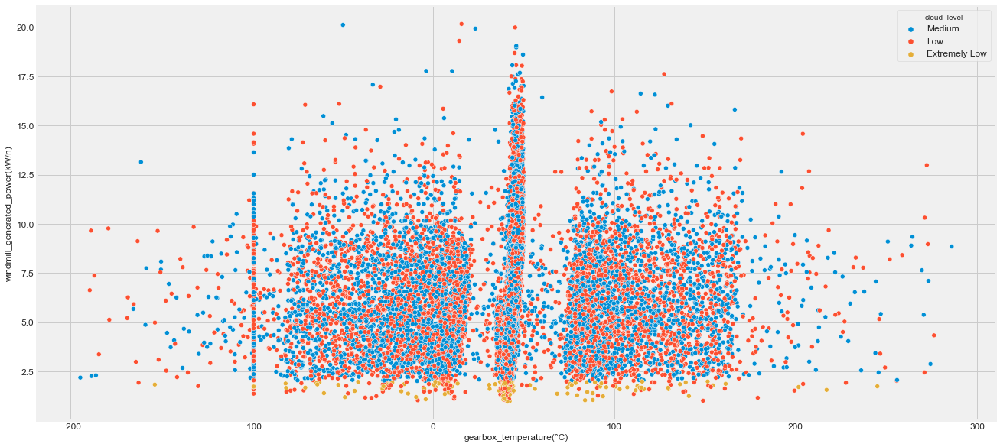

In [42]:
plt.figure(figsize=(20,10))
sns.scatterplot(x='gearbox_temperature(°C)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df_cpy)

### engine_temperature(°C)

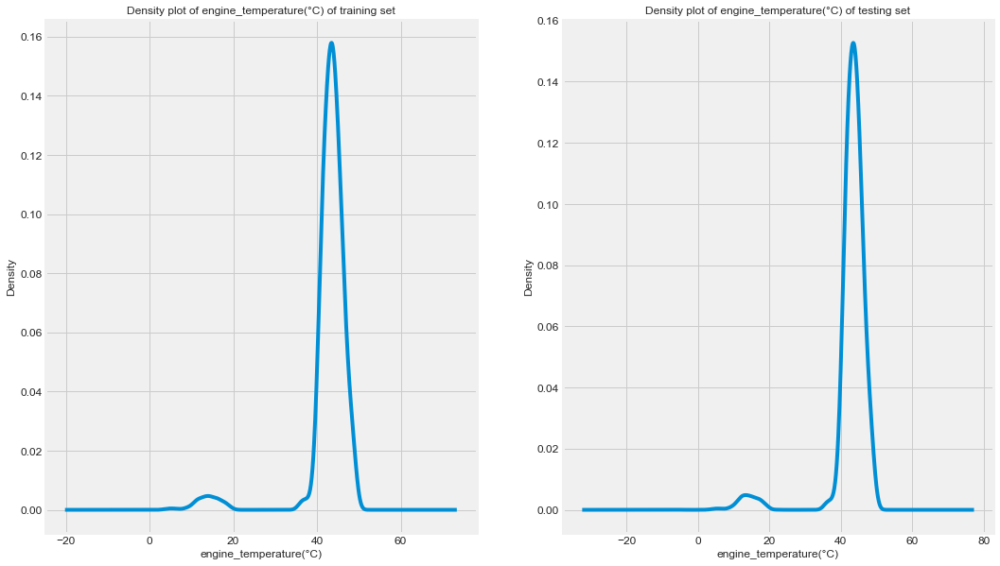

In [43]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'engine_temperature(°C)')
## Distribution of Feature "engine_temperature(°C)" of training and testing dataset are almost similar

<AxesSubplot:ylabel='engine_temperature(°C)'>

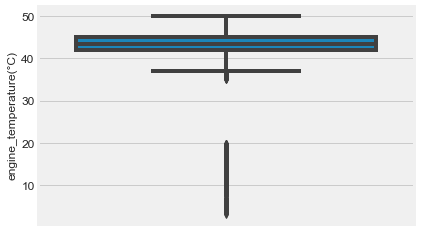

In [44]:
sns.boxplot(y='engine_temperature(°C)',data=df)

<AxesSubplot:xlabel='engine_temperature(°C)', ylabel='windmill_generated_power(kW/h)'>

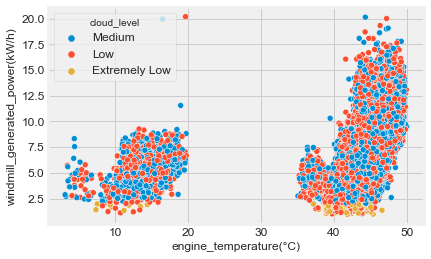

In [45]:
sns.scatterplot(x='engine_temperature(°C)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

In [46]:
## Dropping extreme outliers
low = df_cpy['engine_temperature(°C)'] < 38
low = np.where(low)
df_cpy.drop(low[0],inplace=True)
df_cpy.index = range(df_cpy.shape[0])

* After dropping extreme outliers, the scatterplot of "engine_temperature(°C)" is shown.

<AxesSubplot:xlabel='engine_temperature(°C)', ylabel='windmill_generated_power(kW/h)'>

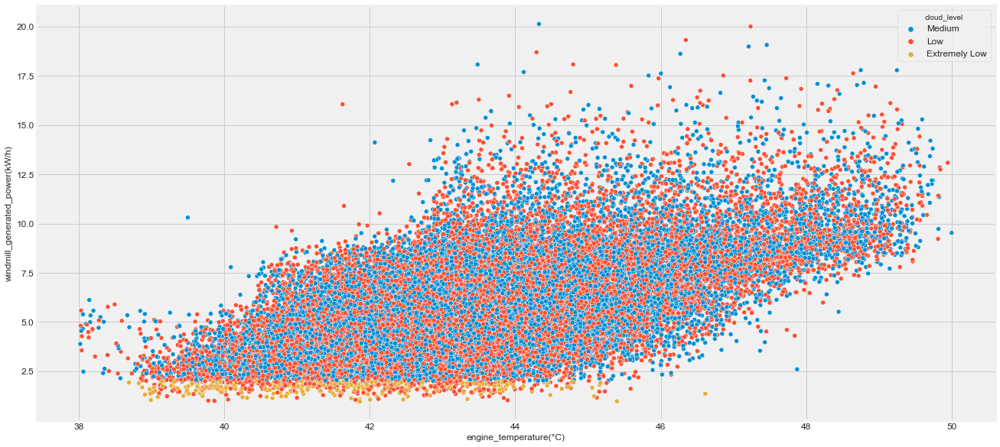

In [47]:
plt.figure(figsize=(20,10))
sns.scatterplot(x='engine_temperature(°C)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df_cpy)

### motor_torque(N-m)

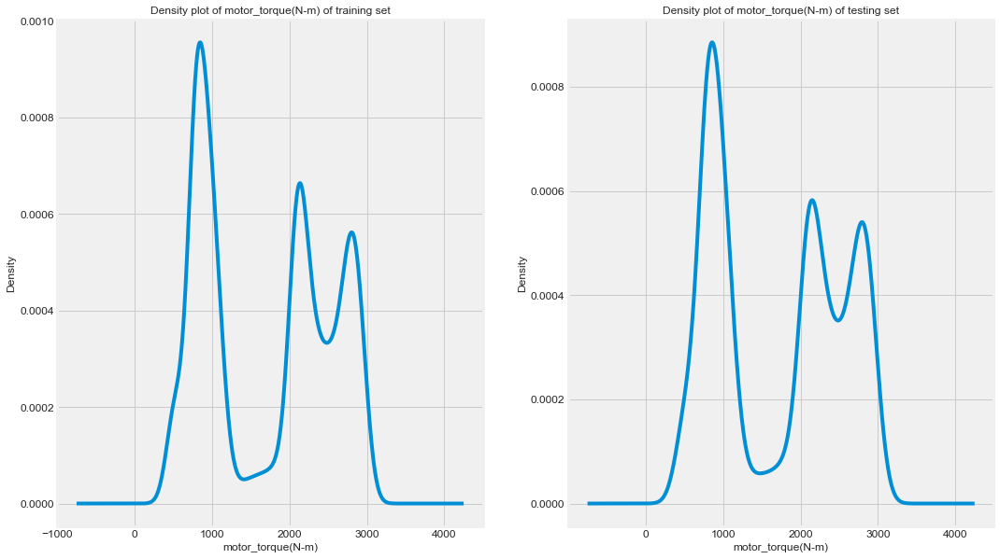

In [48]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'motor_torque(N-m)')
## Distribution of Feature "motor_torque(N-m)" of training and testing dataset are almost similar

<AxesSubplot:ylabel='motor_torque(N-m)'>

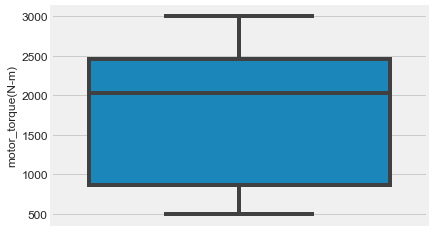

In [49]:
sns.boxplot(y='motor_torque(N-m)',data=df)

<AxesSubplot:xlabel='motor_torque(N-m)', ylabel='windmill_generated_power(kW/h)'>

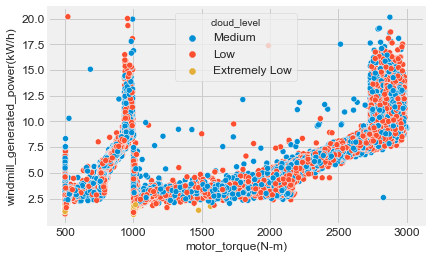

In [50]:
sns.scatterplot(x='motor_torque(N-m)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

* From the above density plot of feature "motor_torque(N-m)", we found that the distribution of "motor_torque(N-m)" is almost same in training and testing dataset, so we are not changing anything in it.

### generator_temperature(°C)

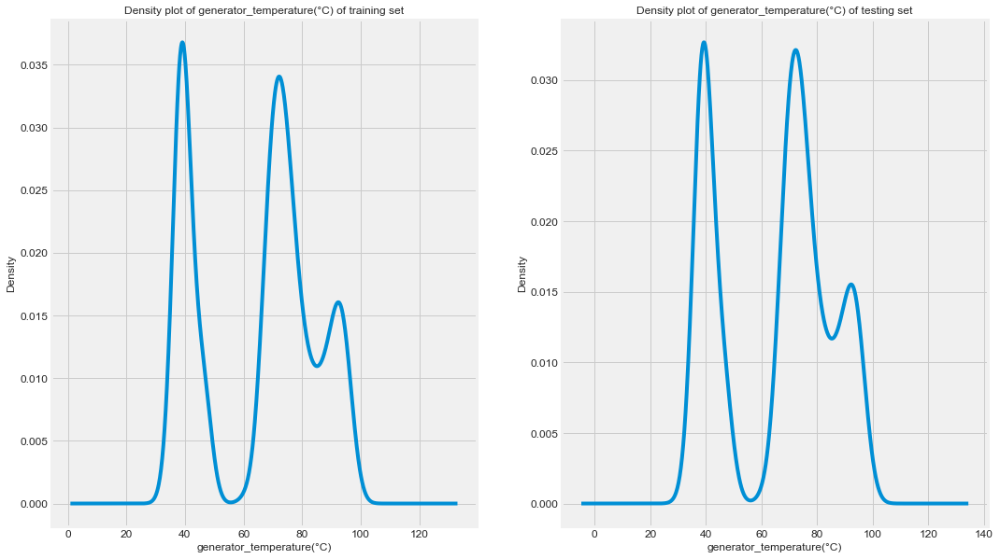

In [51]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'generator_temperature(°C)')
## Distribution of Feature "generator_temperature(°C)" of training and testing dataset are almost same

<AxesSubplot:ylabel='generator_temperature(°C)'>

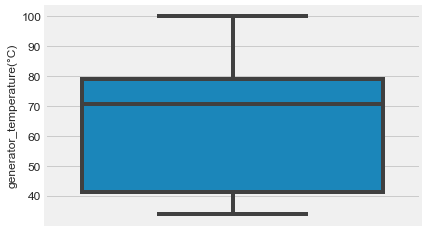

In [52]:
sns.boxplot(y='generator_temperature(°C)',data=df)

<AxesSubplot:xlabel='generator_temperature(°C)', ylabel='windmill_generated_power(kW/h)'>

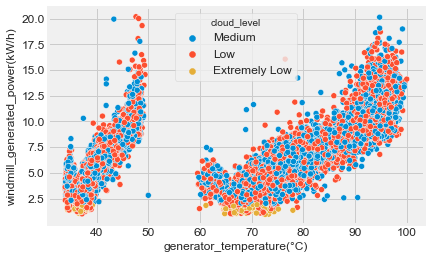

In [53]:
sns.scatterplot(x='generator_temperature(°C)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

* From the above density plot of feature "generator_temperature(°C)", we found that the distribution of "generator_temperature(°C)" is almost same in training and testing dataset, so we are not changing anything in it.

### atmospheric_pressure(Pascal)

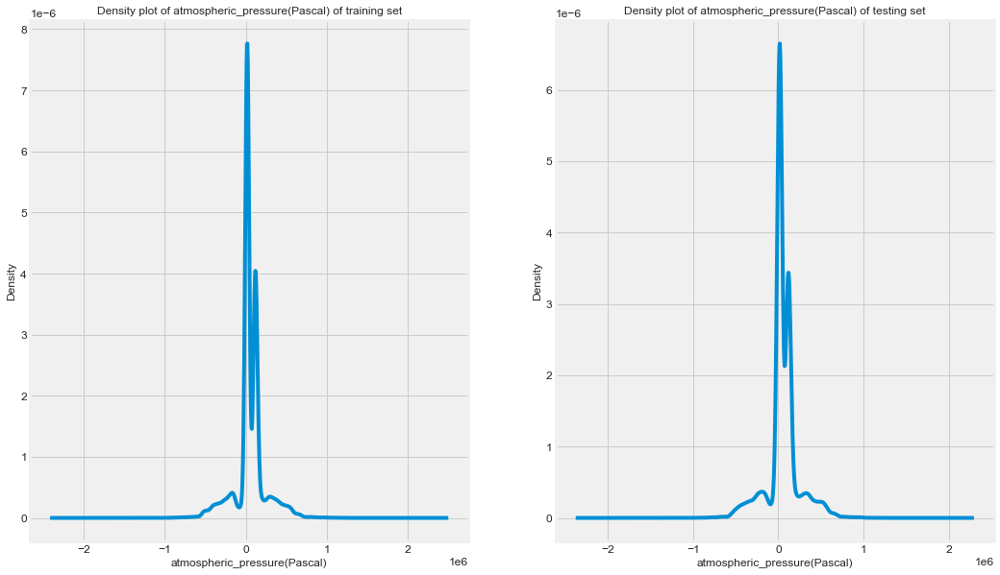

In [54]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'atmospheric_pressure(Pascal)')
## Distribution of Feature "atmospheric_pressure(Pascal)" of training and testing dataset are almost same

<AxesSubplot:ylabel='atmospheric_pressure(Pascal)'>

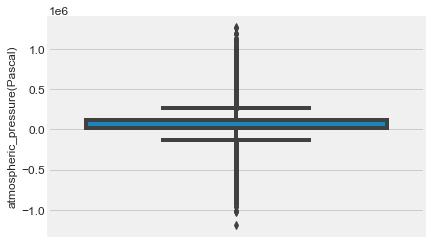

In [55]:
sns.boxplot(y='atmospheric_pressure(Pascal)',data=df)

<AxesSubplot:xlabel='atmospheric_pressure(Pascal)', ylabel='windmill_generated_power(kW/h)'>

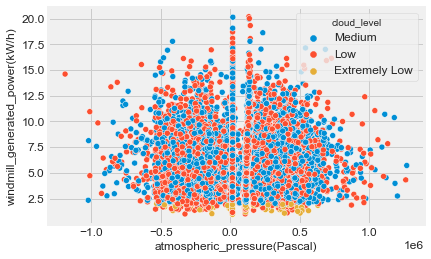

In [56]:
sns.scatterplot(x='atmospheric_pressure(Pascal)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

* From the above density plot of feature "atmospheric_pressure(Pascal)", we found that the distribution of "atmospheric_pressure(Pascal)" is almost same in training and testing dataset, so we are not changing anything in it.

### area_temperature(°C)

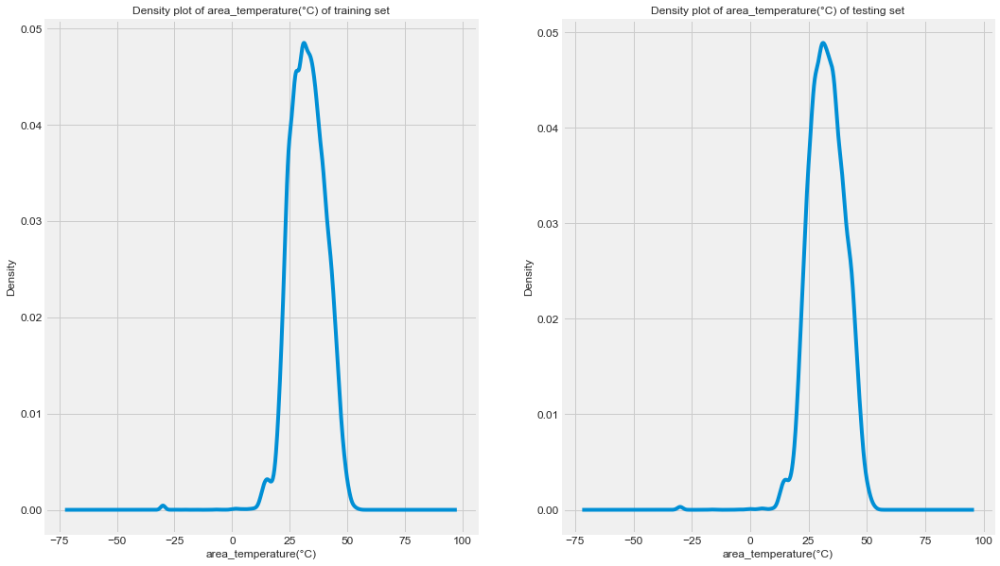

In [57]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'area_temperature(°C)')
## Distribution of Feature "area_temperature(°C)" of training and testing dataset are almost same

<AxesSubplot:ylabel='area_temperature(°C)'>

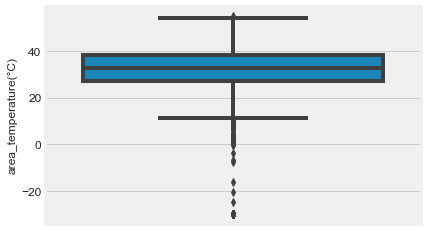

In [58]:
sns.boxplot(y='area_temperature(°C)',data=df)

<AxesSubplot:xlabel='area_temperature(°C)', ylabel='windmill_generated_power(kW/h)'>

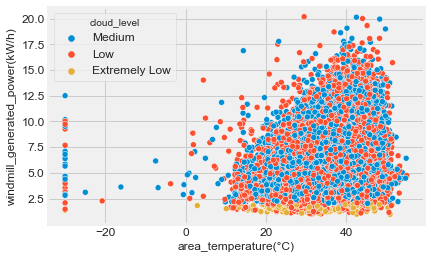

In [59]:
sns.scatterplot(x='area_temperature(°C)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

In [60]:
## Droping extreme outliers
low = df_cpy['area_temperature(°C)'] < 10
low = np.where(low)
df_cpy.drop(low[0],inplace=True)
df_cpy.index = range(df_cpy.shape[0])

* After dropping the extreme outliers, scatterplot of feature "area_temperature(°C)" is shown below

<AxesSubplot:xlabel='area_temperature(°C)', ylabel='windmill_generated_power(kW/h)'>

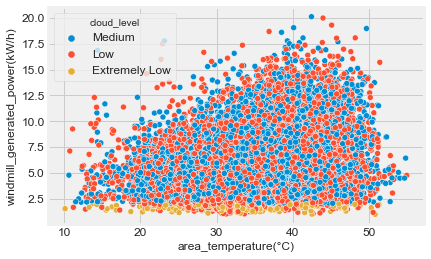

In [61]:
sns.scatterplot(x='area_temperature(°C)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df_cpy)

### windmill_body_temperature(°C)

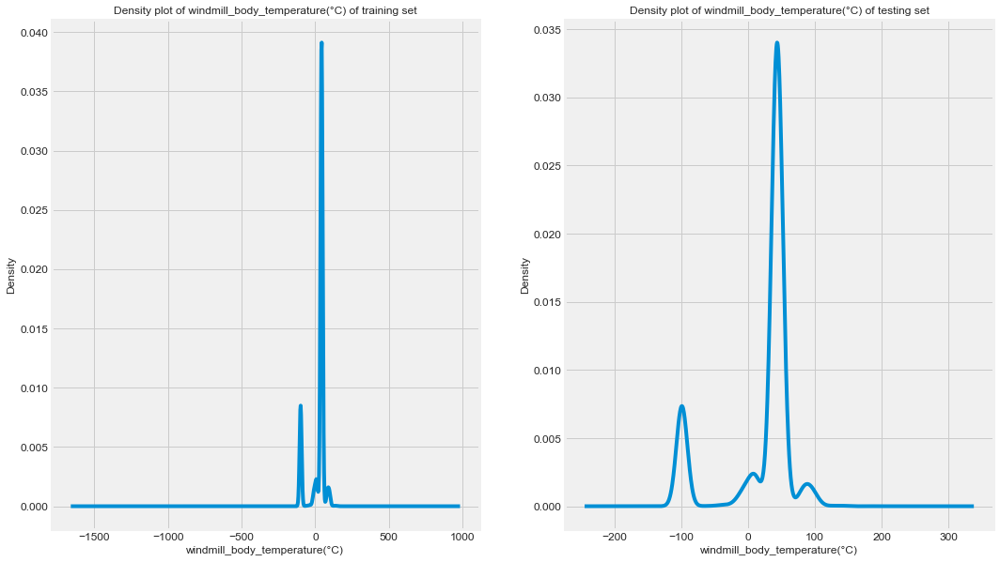

In [62]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'windmill_body_temperature(°C)')
## Distribution of Feature "windmill_body_temperature(°C)" of training and testing dataset is little bit different
## as density plot of windmill_body_temperature(°C) in testing dataset is broader than in training set

<AxesSubplot:ylabel='windmill_body_temperature(°C)'>

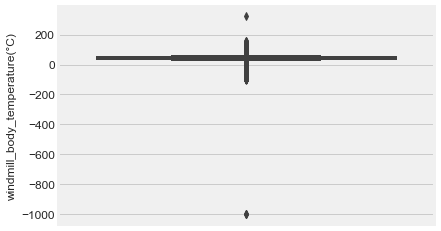

In [63]:
sns.boxplot(y='windmill_body_temperature(°C)',data=df)

<AxesSubplot:xlabel='windmill_body_temperature(°C)', ylabel='windmill_generated_power(kW/h)'>

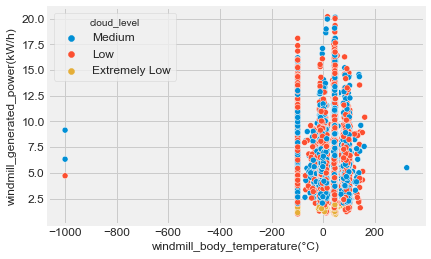

In [64]:
sns.scatterplot(x='windmill_body_temperature(°C)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

In [65]:
df[df['windmill_body_temperature(°C)']< -90]

,tracking_id,datetime,wind_speed(m/s),atmospheric_temperature(°C),shaft_temperature(°C),blades_angle(°),gearbox_temperature(°C),engine_temperature(°C),motor_torque(N-m),generator_temperature(°C),atmospheric_pressure(Pascal),area_temperature(°C),windmill_body_temperature(°C),wind_direction(°),resistance(ohm),rotor_torque(N-m),turbine_status,cloud_level,blade_length(m),blade_breadth(m),windmill_height(m),windmill_generated_power(kW/h)
4,WM_21521,2019-05-04 03:13:20,10.72,nan,41.98,1.72,-17.62,43.47,781.70,37.42,114468.17,34.57,-99.00,259.27,1177.52,13.39,AAA,Medium,nan,0.45,27.97,3.52
7,WM_30330,2019-07-08 21:03:20,48.74,12.72,43.22,-99.00,-48.41,44.13,980.99,43.69,120923.02,30.55,-99.00,nan,1177.64,18.38,BA,Low,2.94,0.35,29.94,8.54
9,WM_28915,2019-06-28 16:13:20,283.79,18.89,41.69,52.34,-62.72,41.88,1042.09,65.28,16160.28,29.38,-99.00,352.27,1662.08,20.10,AC,Extremely Low,1.06,0.20,24.32,1.95
17,WM_16034,2019-03-06 02:53:20,95.30,26.34,13.39,8.34,45.36,44.08,2967.57,90.53,19066.14,36.02,-99.00,475.33,1955.48,49.58,BCB,Medium,2.93,0.38,25.28,10.21
19,WM_4967,2018-12-10 11:23:20,96.32,26.87,46.04,-0.72,43.40,43.58,2628.13,81.97,17792.57,33.42,-99.00,182.37,1890.10,46.66,BA,Medium,4.30,0.49,27.90,7.69
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28141,WM_19432,2019-04-08 00:03:20,93.56,22.40,44.20,-0.96,44.43,45.92,2196.44,74.14,-197556.85,32.54,-99.00,nan,-99.00,37.71,AC,Medium,3.57,0.45,37.00,5.98
28160,WM_34106,2019-08-07 07:33:20,-103.29,-99.00,62.29,-99.00,43.04,41.83,789.49,37.39,117120.68,24.80,-99.00,275.36,1194.65,78.04,BCB,Low,nan,0.35,39.35,4.29
28175,WM_33879,2019-08-05 16:43:20,95.48,-99.00,42.84,-1.18,45.73,45.20,2325.05,78.09,nan,28.17,-99.00,234.25,1782.52,38.60,BBB,Medium,nan,0.43,23.04,6.10
28181,WM_27205,2019-06-16 03:43:20,22.02,1.70,60.78,-1.08,12.23,12.64,825.72,40.21,119518.53,21.80,-99.00,nan,1284.12,14.92,D,Low,3.98,0.46,26.14,6.24


* This feature "windmill_body_temperature(°C)" doesn't have same distribution in training and testing set and it is not much correlated with targetFeature as well. So, we concluded to drop it in the end.

### wind_direction(°)

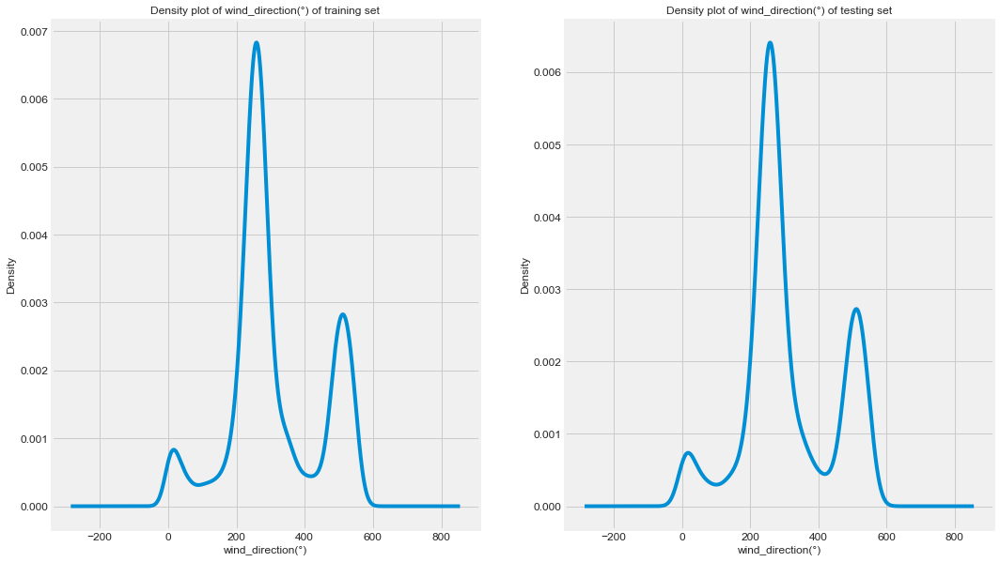

In [66]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'wind_direction(°)')
## Distribution of Feature "wind_direction(°)" of training and testing dataset is almost same

<AxesSubplot:ylabel='wind_direction(°)'>

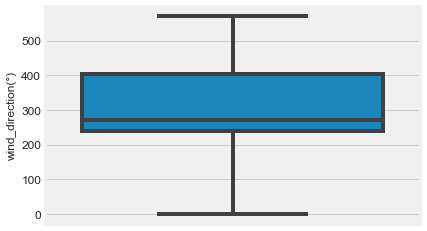

In [67]:
sns.boxplot(y='wind_direction(°)',data=df)

<AxesSubplot:xlabel='wind_direction(°)', ylabel='windmill_generated_power(kW/h)'>

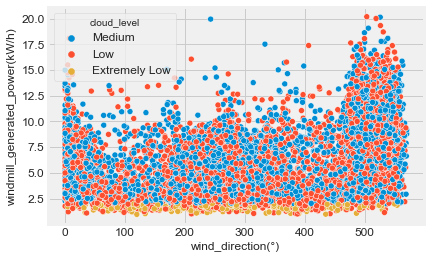

In [68]:
sns.scatterplot(x='wind_direction(°)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

* From the above density plot of feature "wind_direction(°)", we found that the distribution of "wind_direction(°)" is almost same in training and testing dataset, so we are not changing anything in it.

### resistance(ohm)

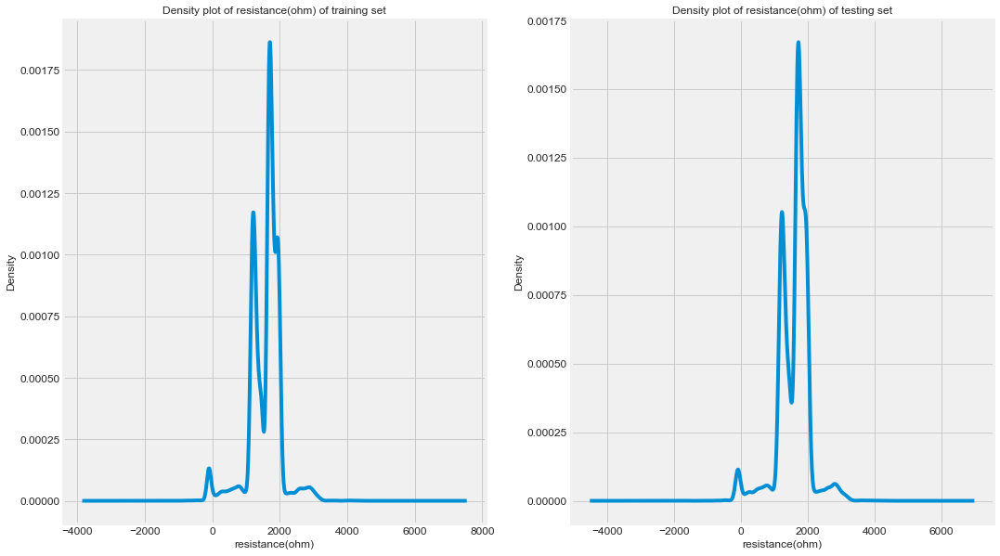

In [69]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'resistance(ohm)')
## Distribution of Feature "resistance(ohm)" of training and testing dataset is almost same

<AxesSubplot:ylabel='resistance(ohm)'>

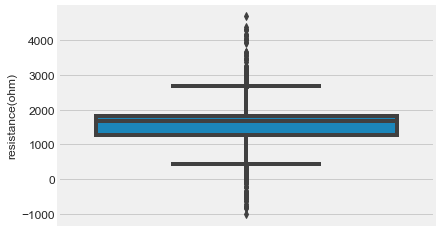

In [70]:
sns.boxplot(y='resistance(ohm)',data=df)

<AxesSubplot:xlabel='resistance(ohm)', ylabel='windmill_generated_power(kW/h)'>

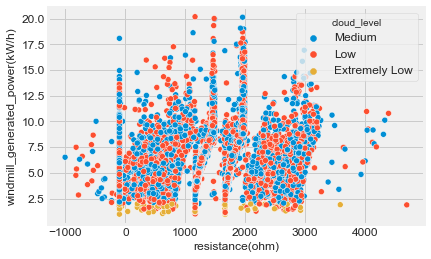

In [71]:
sns.scatterplot(x='resistance(ohm)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

* From the above density plot of feature "resistance(ohm)", we found that the distribution of "resistance(ohm)" is almost same in training and testing dataset, so we are not changing anything in it.

### rotor_torque(N-m)

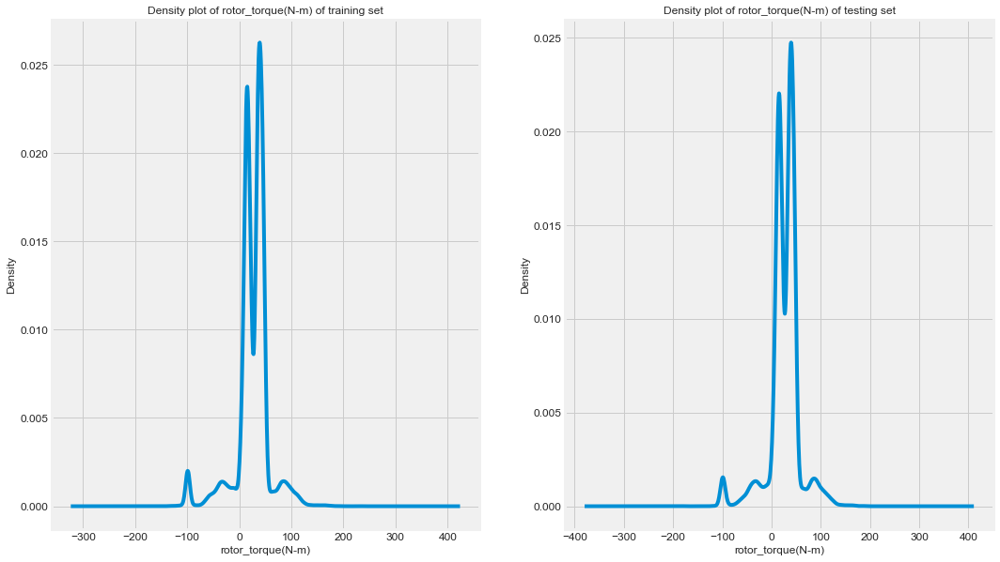

In [72]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'rotor_torque(N-m)')
## Distribution of Feature "rotor_torque(N-m)" of training and testing dataset is almost same

<AxesSubplot:ylabel='rotor_torque(N-m)'>

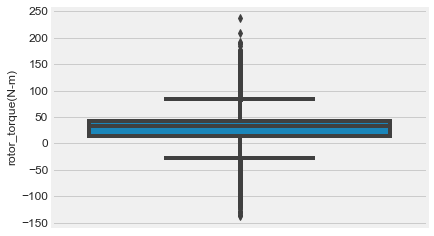

In [73]:
sns.boxplot(y='rotor_torque(N-m)',data=df)

<AxesSubplot:xlabel='rotor_torque(N-m)', ylabel='windmill_generated_power(kW/h)'>

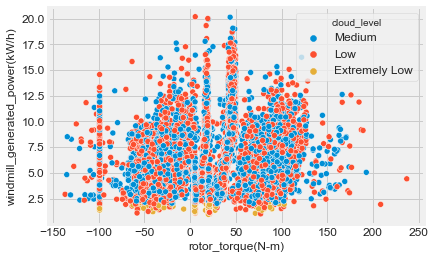

In [74]:
sns.scatterplot(x='rotor_torque(N-m)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

* From the above density plot of feature "rotor_torque(N-m)", we found that the distribution of "rotor_torque(N-m)" is almost same in training and testing dataset, so we are not changing anything in it.

### blade_length(m)

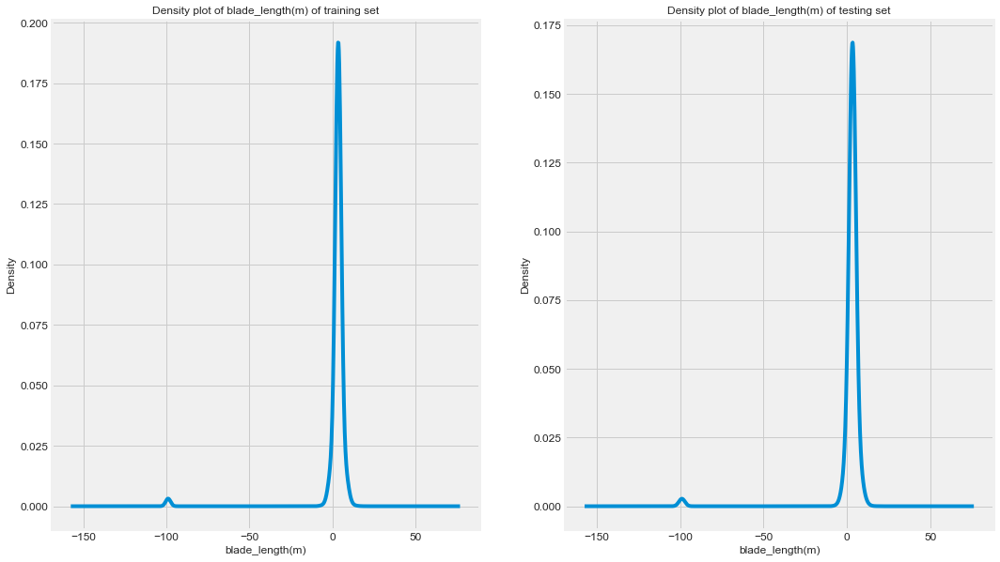

In [75]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'blade_length(m)')
## Distribution of Feature "blade_length(m)" of training and testing dataset is almost same

<AxesSubplot:ylabel='blade_length(m)'>

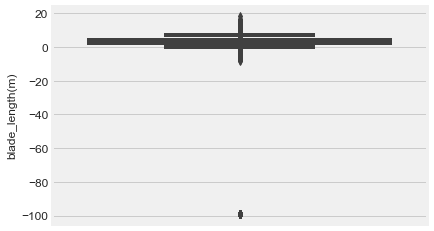

In [76]:
sns.boxplot(y='blade_length(m)',data=df)

<AxesSubplot:xlabel='blade_length(m)', ylabel='windmill_generated_power(kW/h)'>

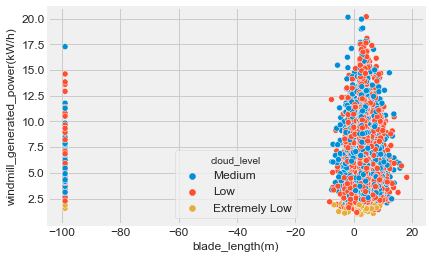

In [77]:
sns.scatterplot(x='blade_length(m)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

In [78]:
## Removing extreme outliers
low = df_cpy['blade_length(m)'] < -20
low = np.where(low)
df_cpy.drop(low[0],inplace=True)
df_cpy.index = range(df_cpy.shape[0])

* After removing extreme outliers, the scatterplot of feature "blade_length(m)" is shown

<AxesSubplot:xlabel='blade_length(m)', ylabel='windmill_generated_power(kW/h)'>

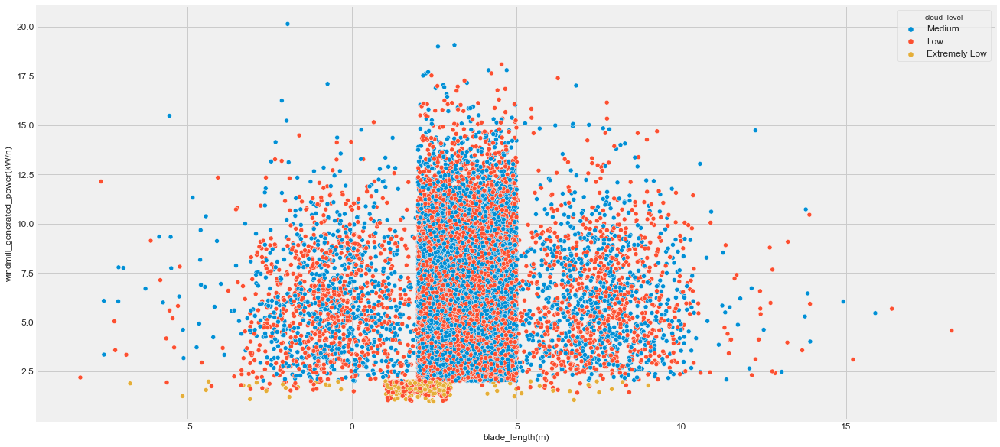

In [79]:
plt.figure(figsize=(20,10))
sns.scatterplot(x='blade_length(m)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df_cpy)

### blade_breadth(m)

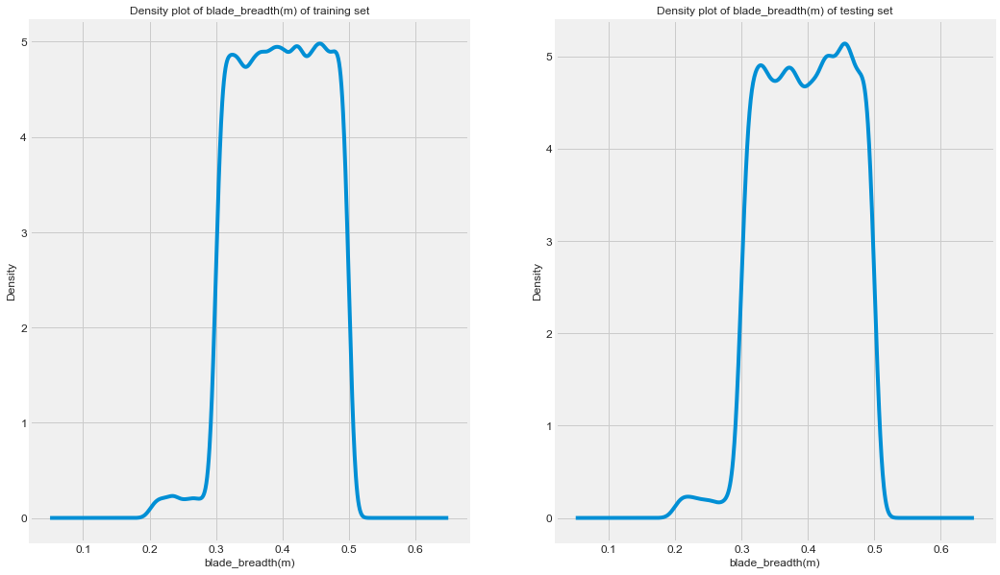

In [80]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'blade_breadth(m)')
## Distribution of Feature "blade_breadth(m)" of training and testing dataset is almost same

<AxesSubplot:ylabel='blade_breadth(m)'>

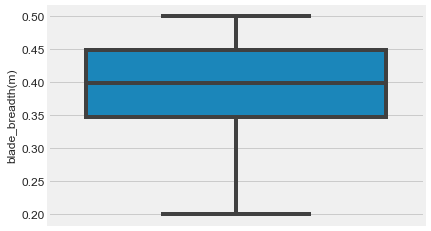

In [81]:
sns.boxplot(y='blade_breadth(m)',data=df)

<AxesSubplot:xlabel='blade_breadth(m)', ylabel='windmill_generated_power(kW/h)'>

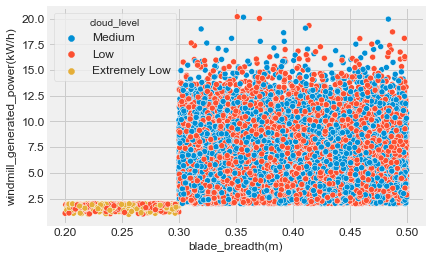

In [82]:
sns.scatterplot(x='blade_breadth(m)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

* From the above density plot of feature "blade_breadth(m)", we found that the distribution of "blade_breadth(m)" is almost same in training and testing dataset, so we are not changing anything in it.

### windmill_height(m)

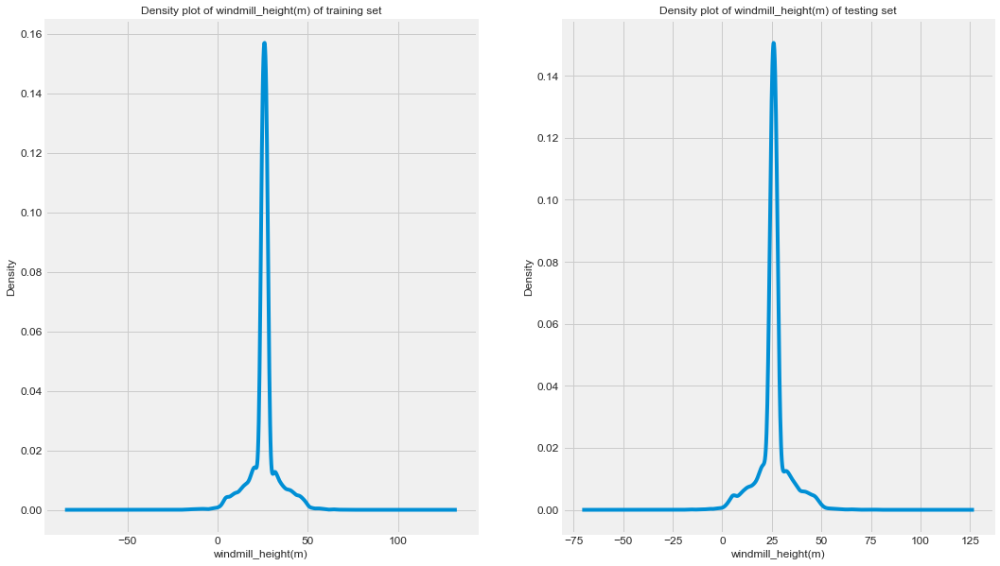

In [83]:
## Comparing the density plot of features in training and testing set
comparing_train_and_test_feature(df,df_test,'windmill_height(m)')
## Distribution of Feature "windmill_height(m)" of training and testing dataset is almost same

<AxesSubplot:ylabel='windmill_height(m)'>

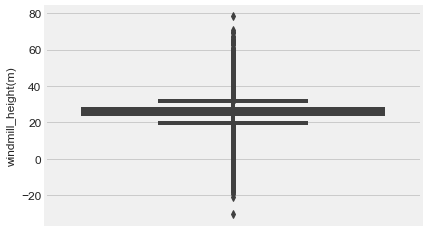

In [84]:
sns.boxplot(y='windmill_height(m)',data=df)

<AxesSubplot:xlabel='windmill_height(m)', ylabel='windmill_generated_power(kW/h)'>

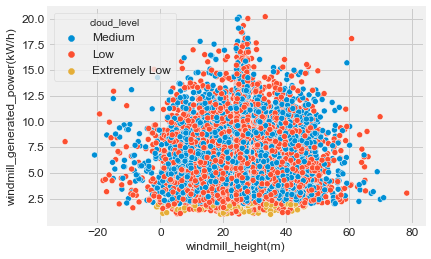

In [85]:
sns.scatterplot(x='windmill_height(m)',y='windmill_generated_power(kW/h)',hue='cloud_level',data=df)

* From the above density plot of feature "windmill_height(m)", we found that the distribution of "windmill_height(m)" is almost same in training and testing dataset, so we are not changing anything in it.

### Data preparation

In [86]:
df_cpy.drop(['generator_temperature(°C)','windmill_body_temperature(°C)'],inplace=True,axis=1)
df_test.drop(['generator_temperature(°C)','windmill_body_temperature(°C)'],inplace=True,axis=1)

In [87]:
df_cpy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26561 entries, 0 to 26560
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   tracking_id                     26561 non-null  object 
 1   datetime                        26561 non-null  object 
 2   wind_speed(m/s)                 26304 non-null  float64
 3   atmospheric_temperature(°C)     23329 non-null  float64
 4   shaft_temperature(°C)           26559 non-null  float64
 5   blades_angle(°)                 26361 non-null  float64
 6   gearbox_temperature(°C)         26560 non-null  float64
 7   engine_temperature(°C)          26560 non-null  float64
 8   motor_torque(N-m)               26553 non-null  float64
 9   atmospheric_pressure(Pascal)    24035 non-null  float64
 10  area_temperature(°C)            26561 non-null  float64
 11  wind_direction(°)               21601 non-null  float64
 12  resistance(ohm)                 

In [88]:
df_cpy.describe()

,wind_speed(m/s),atmospheric_temperature(°C),shaft_temperature(°C),blades_angle(°),gearbox_temperature(°C),engine_temperature(°C),motor_torque(N-m),atmospheric_pressure(Pascal),area_temperature(°C),wind_direction(°),resistance(ohm),rotor_torque(N-m),blade_length(m),blade_breadth(m),windmill_height(m),windmill_generated_power(kW/h)
count,26304.00,23329.00,26559.00,26361.00,26560.00,26560.00,26553.00,24035.00,26561.00,21601.00,26561.00,26039.00,21722.00,26561.00,26047.00,26361.00
mean,71.44,0.83,41.26,-10.44,42.10,43.79,1758.29,50885.00,33.33,308.73,1592.50,26.62,3.47,0.40,25.87,6.18
std,75.72,44.57,26.73,47.00,42.18,2.19,817.89,187383.76,7.07,136.94,480.01,32.44,1.92,0.06,7.77,2.73
min,-402.61,-99.00,-99.00,-146.26,-194.64,38.02,500.00,-1188624.13,10.09,0.00,-1005.22,-136.73,-8.25,0.20,-30.30,0.96
25%,24.18,9.14,41.96,-1.20,41.00,42.16,909.69,16784.05,27.93,237.53,1295.23,14.24,2.58,0.35,24.45,4.06
50%,93.47,16.63,43.82,-0.50,43.41,43.66,2059.57,18067.69,33.09,271.18,1687.18,33.95,3.48,0.40,25.96,5.84
75%,95.33,24.08,45.77,5.39,45.97,45.26,2501.62,117850.81,38.53,431.90,1839.59,41.87,4.37,0.45,27.47,8.04
max,601.46,80.22,169.82,165.93,286.02,50.00,3000.00,1272551.90,55.00,569.97,4693.48,236.88,18.21,0.50,78.35,20.13


* Since, there are missing values in testing data as well so we have to make arrangments for them and therefore replacing the missing values using statistical tools like mean, median and mode

In [89]:
df_cpy['gearbox_temperature(°C)'].fillna(df_cpy['gearbox_temperature(°C)'].mean(),inplace=True)
df_cpy['area_temperature(°C)'].fillna(df_cpy['area_temperature(°C)'].mean(),inplace=True)
df_cpy['rotor_torque(N-m)'].fillna(df_cpy['rotor_torque(N-m)'].mean(),inplace=True)
df_cpy['blade_length(m)'].fillna(df_cpy['blade_length(m)'].mean(),inplace=True)
df_cpy['blade_breadth(m)'].fillna(df_cpy['blade_breadth(m)'].mean(),inplace=True)
df_cpy['windmill_height(m)'].fillna(df_cpy['windmill_height(m)'].mean(),inplace=True)
df_cpy['cloud_level'].fillna(df_cpy['cloud_level'].mode()[0],inplace=True)
df_cpy['atmospheric_temperature(°C)'].fillna(df_cpy['atmospheric_temperature(°C)'].mean(),inplace=True)
df_cpy['atmospheric_pressure(Pascal)'].fillna(df_cpy['atmospheric_pressure(Pascal)'].mean(),inplace=True)
df_cpy['wind_speed(m/s)'].fillna(df_cpy['wind_speed(m/s)'].mean(),inplace=True)
df_cpy['shaft_temperature(°C)'].fillna(df_cpy['shaft_temperature(°C)'].mean(),inplace=True)
df_cpy['blades_angle(°)'].fillna(df_cpy['blades_angle(°)'].mean(),inplace=True)
df_cpy['engine_temperature(°C)'].fillna(df_cpy['engine_temperature(°C)'].mean(),inplace=True)
df_cpy['motor_torque(N-m)'].fillna(df_cpy['motor_torque(N-m)'].mean(),inplace=True)
df_cpy['wind_direction(°)'].fillna(df_cpy['wind_direction(°)'].mean(),inplace=True)

In [90]:
df_test['gearbox_temperature(°C)'].fillna(df_test['gearbox_temperature(°C)'].mean(),inplace=True)
df_test['area_temperature(°C)'].fillna(df_test['area_temperature(°C)'].mean(),inplace=True)
df_test['rotor_torque(N-m)'].fillna(df_test['rotor_torque(N-m)'].mean(),inplace=True)
df_test['blade_length(m)'].fillna(df_test['blade_length(m)'].mean(),inplace=True)
df_test['blade_breadth(m)'].fillna(df_test['blade_breadth(m)'].mean(),inplace=True)
df_test['windmill_height(m)'].fillna(df_test['windmill_height(m)'].mean(),inplace=True)
df_test['cloud_level'].fillna(df_test['cloud_level'].mode()[0],inplace=True)
df_test['atmospheric_temperature(°C)'].fillna(df_test['atmospheric_temperature(°C)'].mean(),inplace=True)
df_test['atmospheric_pressure(Pascal)'].fillna(df_test['atmospheric_pressure(Pascal)'].mean(),inplace=True)
df_test['wind_speed(m/s)'].fillna(df_test['wind_speed(m/s)'].mean(),inplace=True)
df_test['shaft_temperature(°C)'].fillna(df_test['shaft_temperature(°C)'].mean(),inplace=True)
df_test['blades_angle(°)'].fillna(df_test['blades_angle(°)'].mean(),inplace=True)
df_test['engine_temperature(°C)'].fillna(df_test['engine_temperature(°C)'].mean(),inplace=True)
df_test['motor_torque(N-m)'].fillna(df_test['motor_torque(N-m)'].mean(),inplace=True)
df_test['wind_direction(°)'].fillna(df_test['wind_direction(°)'].mean(),inplace=True)

In [91]:
df_cpy.dropna(how='any',axis=0,inplace=True)

In [92]:
## Feature "cloud_level" is categorical with 3 unique values
df_cpy['cloud_level'].replace(['Medium', 'Low', 'Extremely Low'],[2,1,0],inplace=True)
df_test['cloud_level'].replace(['Medium', 'Low', 'Extremely Low'],[2,1,0],inplace=True)

In [93]:
df_cpy['turbine_status'].value_counts()

AAA    1819
A      1815
B2     1813
BB     1799
BCB    1795
D      1780
B      1752
AC     1749
A2     1745
ABC    1745
AB     1740
BA     1733
BD     1724
BBB    1710
Name: turbine_status, dtype: int64

In [94]:
## Using dummy variables for feature "turbine_status"
dum = ['turbine_status']
df_dum = pd.get_dummies(df_cpy[dum])
df_test_dum = pd.get_dummies(df_test[dum])
df_dum

,turbine_status_A,turbine_status_A2,turbine_status_AAA,turbine_status_AB,turbine_status_ABC,turbine_status_AC,turbine_status_B,turbine_status_B2,turbine_status_BA,turbine_status_BB,turbine_status_BBB,turbine_status_BCB,turbine_status_BD,turbine_status_D
0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26556,0,0,0,0,0,0,0,0,0,1,0,0,0,0
26557,0,0,0,0,0,0,0,0,0,1,0,0,0,0
26558,0,0,0,0,0,0,0,0,0,0,0,0,0,1
26559,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [95]:
df_cpy = pd.concat([df_cpy,df_dum],axis=1)
df_test = pd.concat([df_test,df_test_dum],axis=1)

In [96]:
## Converting the feature "datetime" into pandas datetime format
df_cpy['datetime'] = pd.to_datetime(df_cpy['datetime'])
df_test['datetime'] = pd.to_datetime(df_test['datetime'])

In [97]:
## Extracting some informations for the feature "datetime" and making new features from it
df_cpy['dmonth'] = df_cpy['datetime'].dt.month
df_cpy['dday'] = df_cpy['datetime'].dt.day
df_cpy['ddayofweek'] = df_cpy['datetime'].dt.dayofweek

df_test['dmonth'] = df_test['datetime'].dt.month
df_test['dday'] = df_test['datetime'].dt.day
df_test['ddayofweek'] = df_test['datetime'].dt.dayofweek

### Data modelling

In [98]:
X = df_cpy.drop(['tracking_id','datetime','windmill_generated_power(kW/h)','turbine_status'],axis=1)
Y = df_cpy['windmill_generated_power(kW/h)']
X_test = df_test.drop(['tracking_id','datetime','turbine_status'],axis=1)
print(X.shape,Y.shape)
print(X_test.shape)

(24719, 33) (24719,)
(12086, 33)


In [99]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
X = scaler.fit_transform(X)
X_test = scaler.transform(X_test)

In [100]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(X,Y,train_size=0.8,random_state=42)
print(x_train.shape,y_train.shape)
print(x_test.shape,y_test.shape)

(19775, 33) (19775,)
(4944, 33) (4944,)


### RandomForestRegressor

In [102]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
rf = RandomForestRegressor()
rf.fit(x_train,y_train)
y_train_pred = rf.predict(x_train)
y_test_pred = rf.predict(x_test)
print(r2_score(y_train,y_train_pred))
print(r2_score(y_test,y_test_pred))

0.9943604941794628
0.9690297161791481


### GradientBoostingRegressor

In [103]:
from sklearn.ensemble import GradientBoostingRegressor
gb_model = GradientBoostingRegressor(criterion='mse',random_state=0,max_depth=5,
                                     n_estimators=500,min_samples_split=2,min_samples_leaf=2)
gb_model.fit(x_train,y_train)
y_train_pred = gb_model.predict(x_train)
y_test_pred = gb_model.predict(x_test)
print(r2_score(y_train,y_train_pred))
print(r2_score(y_test,y_test_pred))

0.9901172397994408
0.9703655065720184


### XGBRegressor

In [104]:
from xgboost import XGBRegressor
xgb = XGBRegressor(n_estimators=500,max_depth=5,booster='gbtree',n_jobs=-1,learning_rate=0.1,reg_lambda=0.01,reg_alpha=0.3)
xgb.fit(x_train,y_train)
y_train_pred = xgb.predict(x_train)
y_test_pred = xgb.predict(x_test)
print(r2_score(y_train,y_train_pred))
print(r2_score(y_test,y_test_pred))

0.9904497506886722
0.9705159738735555


### Mixed model of three different models

In [105]:
import sklearn.base as skb
class MixModel(skb.BaseEstimator,skb.RegressorMixin,skb.TransformerMixin):
    def __init__(self,algs):
        self.algs = algs
    def fit(self,X,y):
        self.algs_ = [skb.clone(x) for x in self.algs]
        for alg in self.algs_:
            alg.fit(X,y)
        return self
    def predict(self,X):
        predictions = np.column_stack([
            stacked_model.predict(X) for stacked_model in self.algs_
        ])
        return np.mean(predictions,axis=1)

In [106]:
## Using mixed model of random forest, gradient boosting and XGB Regressor
mixed_model = MixModel(algs = [xgb,rf,gb_model])
mixed_model.fit(x_train, y_train)
y_train_pred = mixed_model.predict(x_train)
y_test_pred = mixed_model.predict(x_test)
print(r2_score(y_train,y_train_pred))
print(r2_score(y_test,y_test_pred))

0.9929025957512498
0.9722389549680985


### Test Evaluation and Submission

In [107]:
df_test = pd.read_csv('test.csv')

In [108]:
df_sub = df_test[['tracking_id','datetime']]

In [109]:
results = mixed_model.predict(X_test)

In [110]:
results

array([ 2.57464247,  2.56860571,  3.24855247, ...,  4.91946419,
        5.47715438, 10.48219112])

In [111]:
df_sub['windmill_generated_power(kW/h)'] = results

In [112]:
df_sub.to_csv('newsubmsn_Mixed Model(xgb,rf,gb).csv',header=True,index=False)
df_sub

,tracking_id,datetime,windmill_generated_power(kW/h)
0,WM_19817,2019-04-17 08:53:20,2.57
1,WM_18723,2019-03-30 07:43:20,2.57
2,WM_34552,2019-08-10 11:33:20,3.25
3,WM_28570,2019-06-26 03:53:20,8.08
4,WM_36934,2019-08-27 16:43:20,3.65
...,...,...,...
12081,WM_13376,2019-02-12 11:33:20,6.63
12082,WM_1630,2018-11-12 17:33:20,3.25
12083,WM_24703,2019-05-27 11:53:20,4.92
12084,WM_22893,2019-05-13 21:53:20,5.48


* This dataset is `not based` on the `real world scenario` and is synthetically generated as some of the features like blade_width, wind_speed and so on, have `negative values` which are meaningless. The testing set is also the subset of training set as both are having almost `same distributions` among almost every feature. By `removing` all outliers from the training set, its distribution will `differ` highly from the testing set which results in `less score` on testing set and therefore `only` extreme outliers are removed by us, so that the distribution remains almost same.

* Here, we used models like `Linear Regression ,Lasso Regression, Ridge Regression, Random Forest Regressor, ExtraTress Regressor, Gradient Boosting Regressor and XGB Regressor with manual hyper parameter tunning`. For me, Random Forest , Gradient Boosting and XGB Regressor was performing best and hence, used a mixed model of these three models with brings me the best results. I would suggest to do more feature engineering and hyper parameter tunning with different models may bring excellent results.